# Load necessary packages and define handy functions

In [1]:
# Standard modules
import sys

# 3rd party modules
import xarray as xr
import numpy as np
from scipy import integrate
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cftime


# we add our 'cesm_tools' directory to pythons look-up path
# then we can import python files using the 'import command'
sys.path.insert(0, "/home/slingbeek/scripts/cesm_tools/")
import cesm_scenarios2 # 'cesm_scenarios' contains the 'Scenario' class

# to suppress annoying warnings
import warnings
warnings.filterwarnings('ignore')

In [36]:
save = True
imgsize1 = (7.48,2.5)
imgsize2 = (3.74,6)
imgsize3 = (7.48,4)
imgsize4 = (7.48,4.5)
imgsize5 = (7.48,5)
imgsize6 = (7.48,8)
imgsize7 = (7.48,9)

plt.rcParams.update({'font.size': 8})
plt.rcParams['hatch.linewidth'] = 0.5
plt.rcParams['figure.dpi'] = 300

slice_i = slice('2016','2035')
slice_f = slice('2111','2130')

scens = ['i_c', 'f_c', 'f_20', 'f_80']#, 'i_20']
scensJJA = ['iJJA_c', 'fJJA_c', 'fJJA_20', 'fJJA_80']#, 'iJJA_20']
scensDJF = ['iDJF_c', 'fDJF_c', 'fDJF_20', 'fDJF_80']#, 'iDJF_20']

diffscens = ['cref', '20ref', '80ref']
diffscensJJA = ['crefJJA', '20refJJA', '80refJJA']
diffscensDJF = ['crefDJF', '20refDJF', '80refDJF']

savepath = '/home/slingbeek/git_map/MScThesis/TeX/images/'


In [3]:
def surf_mean(field):
    weights = np.cos(np.deg2rad(field.lat))
    weighted = field.weighted(weights)
    return weighted.mean(('lon','lat'))

In [4]:
def time_mean(field):
    ds = field
    ds['tw'] = (ds.time_bnds[:,1].astype("datetime64[ns]") - ds.time_bnds[:,0].astype("datetime64[ns]")).dt.days
    return ds.weighted(ds.tw).mean('time', keep_attrs=True).drop('tw')

In [5]:
def to_monthly(ds):
    year = ds.time.dt.year
    month = ds.time.dt.month

    # assign new coords
    ds = ds.assign_coords(year=("time", year.data), month=("time", month.data))

    # reshape the array to (..., "month", "year")
    return ds.set_index(time=("year", "month")).unstack("time")

In [6]:
def T0_func(ds):
    psi = np.deg2rad(ds.lat)
    A = integrate.simpson(y=np.cos(psi), x=psi)
    L0 = ds.mean(dim='lon')*np.cos(psi)
    T0 = (1/A) * integrate.simpson(y=L0, x=psi)
    return T0

In [7]:
def T1_func(ds):
    psi = np.deg2rad(ds.lat)
    A = integrate.simpson(y=np.cos(psi), x=psi)
    L1 = ds.mean(dim='lon')*np.sin(psi)*np.cos(psi)
    T1 = (1/A) * integrate.simpson(y=L1, x=psi)
    return T1

In [8]:
def T2_func(ds):
    psi = np.deg2rad(ds.lat)
    A = integrate.simpson(y=np.cos(psi), x=psi)
    L2 = ds.mean(dim='lon')*(1/2)*(3*np.sin(psi)**2-1)*np.cos(psi)
    T2 = (1/A) * integrate.simpson(y=L2, x=psi)
    return T2

In [9]:
p_ref = 100000
cp = 1004
Rdry = 286.9
kappa = Rdry/cp

def theta(ds):
    return ds.T*(p_ref/ds.plev)**kappa

def theta2(ds, var):
    return ds[var]*(p_ref/ds.plev)**kappa


In [10]:
def add_headers(
    fig,
    *,
    row_headers=None,
    col_headers=None,
    row_pad=1,
    col_pad=5,
    rotate_row_headers=True,
    **text_kwargs
):
    # Based on https://stackoverflow.com/a/25814386

    axes = fig.get_axes()

    for ax in axes:
        sbs = ax.get_subplotspec()

        # Putting headers on cols
        if (col_headers is not None) and sbs.is_first_row():
            ax.annotate(
                col_headers[sbs.colspan.start],
                xy=(0.5, 1),
                xytext=(0, col_pad),
                xycoords="axes fraction",
                textcoords="offset points",
                ha="center",
                va="baseline",
                **text_kwargs,
            )

        # Putting headers on rows
        if (row_headers is not None) and sbs.is_first_col():
            ax.annotate(
                row_headers[sbs.rowspan.start],
                xy=(0, 0.5),
                xytext=(-ax.yaxis.labelpad - row_pad, 0),
                xycoords=ax.yaxis.label,
                textcoords="offset points",
                ha="right",
                va="center",
                rotation=rotate_row_headers * 90,
                **text_kwargs,
            )

# Define scenarios and load data

In [11]:
# Meta data
dir = '/home/slingbeek/cesm2_data/monthly'
cases_cnt = {'b.e21.BSSP585cmip6.f09_g17.control.01': {'directory': dir, 'years': np.arange(2015,2100)},
             'b.e21.BSSP585cmip6.f09_g17.control.06': {'directory': dir, 'years': np.arange(2100,2131)}
}
cases_sai20 = {'b.e21.BSSP585cmip6.f09_g17.2020feedback.01': {'directory': dir,'years': np.arange(2020,2045)},
               'b.e21.BSSP585cmip6.f09_g17.2020feedback.02': {'directory': dir,'years': np.arange(2045,2100)},
               'b.e21.BSSP585cmip6.f09_g17.2020feedback.02_ext02': {'directory': dir,'years': np.arange(2100,2131)}
}
cases_sai80 = {'b.e21.BSSP585cmip6.f09_g17.feedback.05': {'directory': dir, 'years': np.arange(2080,2086)},
               'b.e21.BSSP585cmip6.f09_g17.feedback.06': {'directory': dir, 'years': np.arange(2086,2100)},
               'b.e21.BSSP585cmip6.f09_g17.2080feedback_ext01': {'directory': dir, 'years': np.arange(2100,2131)}
}

cases = [cases_cnt, cases_sai20, cases_sai80]
scenario_names = ['Control', 'SAI 2020', 'SAI 2080']

# Define dictionary
scenarios = {name: cesm_scenarios2.Scenario(name,case) for name, case in zip(scenario_names,cases)}


# Temperature gradients

## Data

In [12]:
scenarios['Control'].get_atm_var2('TREFHT')
scenarios['SAI 2020'].get_atm_var2('TREFHT')
scenarios['SAI 2080'].get_atm_var2('TREFHT')
trefht_C_c = scenarios['Control']['TREFHT']['TREFHT']
trefht_C_20 = scenarios['SAI 2020']['TREFHT']['TREFHT']
trefht_C_80 = scenarios['SAI 2080']['TREFHT']['TREFHT']


scen_t = ['C_c', 'C_20', 'C_80']
deltas = ['C_cref', 'C_20ref', 'C_80ref']

tfull = {
    'C_c':trefht_C_c,
    'C_20':trefht_C_20,
    'C_80':trefht_C_80
}

In [13]:
time_dict = {}
for i in range(len(deltas)):
    time_dict[deltas[i]] = tfull[scen_t[i]].groupby('time.year').mean(dim='time').year

In [14]:
### T0 - GMST compared to 2020
T0 = {}
for i in scen_t:
    T0[i] = T0_func(tfull[i].groupby('time.year').mean(dim='time'))

deltaT0 = {
    'C_cref':T0['C_c']- np.mean(T0['C_c'][0:10]),
    'C_20ref':T0['C_20'] - np.mean(T0['C_c'][0:10]),
    'C_80ref':T0['C_80'] - np.mean(T0['C_c'][0:10])
}


In [15]:
### T1 - Interhemispheric temperature
T1 = {}
for i in scen_t:
    T1[i] = T1_func(tfull[i].groupby('time.year').mean(dim='time'))

deltaT1 = {
    'C_cref':T1['C_c']- np.mean(T1['C_c'][0:10]),
    'C_20ref':T1['C_20'] - np.mean(T1['C_c'][0:10]),
    'C_80ref':T1['C_80'] - np.mean(T1['C_c'][0:10])
}

In [16]:
### T2 - equator-to-pole temperature 
T2 = {}
for i in scen_t:
    T2[i] = T2_func(tfull[i].groupby('time.year').mean(dim='time'))

deltaT2 = {
    'C_cref':T2['C_c']- np.mean(T2['C_c'][0:10]),
    'C_20ref':T2['C_20'] - np.mean(T2['C_c'][0:10]),
    'C_80ref':T2['C_80'] - np.mean(T2['C_c'][0:10])
}

## Plot

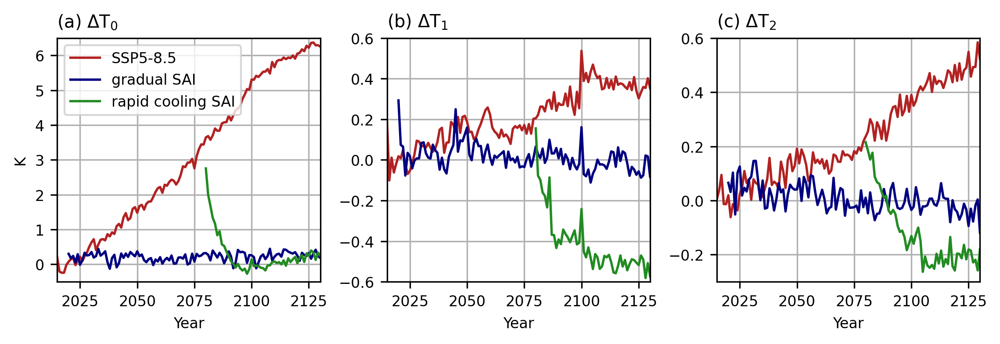

In [17]:
cols = ['firebrick', 'navy', 'forestgreen']
labels = ['SSP5-8.5', 'gradual SAI', 'rapid cooling SAI']

fig, axs = plt.subplots(1,3, sharex=True, figsize=imgsize1, layout='constrained')

for i in range(len(deltas)):
    axs[0].plot(time_dict[deltas[i]], deltaT0[deltas[i]], label=labels[i], color=cols[i], linewidth=1.3)

axs[0].set_xlabel('Year')
axs[0].set_ylabel('K')
axs[0].legend()
axs[0].grid()
axs[0].set_ylim(-0.5,6.5)
axs[0].set_xlim(2015,2130)
axs[0].set_title(r'(a) $\Delta$T$_0$', loc='left')


for i in range(len(deltas)):
    axs[1].plot(time_dict[deltas[i]], deltaT1[deltas[i]], color=cols[i], linewidth=1.3)

axs[1].set_xlabel('Year')
axs[1].set_ylabel('')
axs[1].grid()
axs[1].set_ylim(-0.6,0.6)
axs[1].set_title(r'(b) $\Delta$T$_1$', loc='left')


for i in range(len(deltas)):
    axs[2].plot(time_dict[deltas[i]], deltaT2[deltas[i]], color=cols[i], linewidth=1.3)

axs[2].set_xlabel('Year')
axs[2].set_ylabel('')
axs[2].grid()
axs[2].set_ylim(-0.3,0.6)
axs[2].set_title(r'(c) $\Delta$T$_2$', loc='left')

if save == True: plt.savefig(savepath+'Tgrad_ext.png');


# Reference height temperatures

In [18]:
scenarios['Control'].get_atm_var2('TREFHT')
scenarios['SAI 2020'].get_atm_var2('TREFHT')
scenarios['SAI 2080'].get_atm_var2('TREFHT')


scenarios['Control']['TREFHT']['TREFHT'] = scenarios['Control']['TREFHT']['TREFHT'] - 273.15
scenarios['SAI 2020']['TREFHT']['TREFHT'] = scenarios['SAI 2020']['TREFHT']['TREFHT'] - 273.15
scenarios['SAI 2080']['TREFHT']['TREFHT'] = scenarios['SAI 2080']['TREFHT']['TREFHT'] - 273.15


In [19]:
trefht = {
    'i_c':time_mean(scenarios['Control']['TREFHT'].sel(time=slice_i))['TREFHT'],
    'f_c':time_mean(scenarios['Control']['TREFHT'].sel(time=slice_f))['TREFHT'],
    'f_20':time_mean(scenarios['SAI 2020']['TREFHT'].sel(time=slice_f))['TREFHT'],
    'f_80':time_mean(scenarios['SAI 2080']['TREFHT'].sel(time=slice_f))['TREFHT']
}

In [20]:
trefht_d = {}

trefht_d['i_c'] = trefht['i_c'].compute()

for i,j in zip(diffscens, scens[1:]):
    trefht_d[i] = (trefht[j] - trefht['i_c']).compute()
    trefht_d[i] = (trefht[j] - trefht['i_c']).compute()
    trefht_d[i] = (trefht[j] - trefht['i_c']).compute()



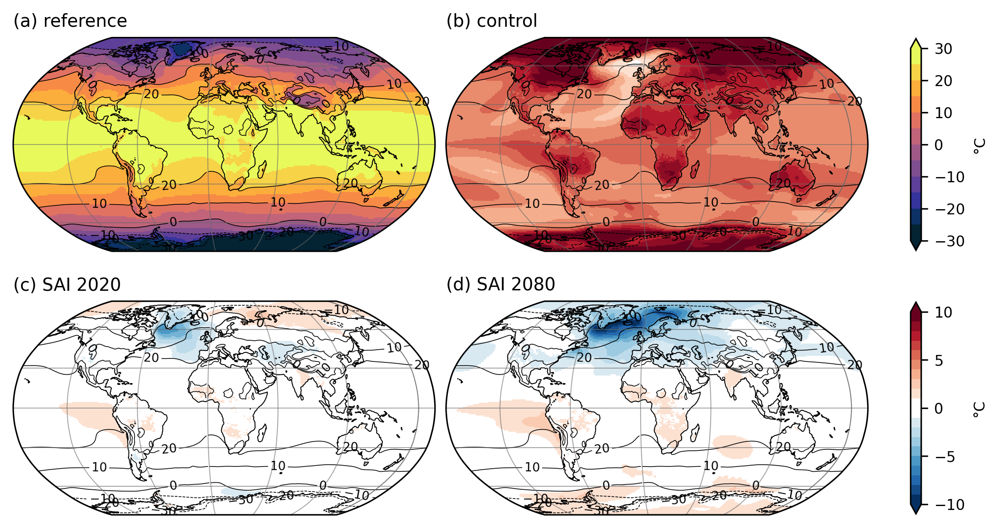

In [21]:
scen_used = ['i_c', 'cref', '20ref', '80ref']
labels = ['(a) reference', '(b) control', '(c) SAI 2020', '(d) SAI 2080']

fig, axs = plt.subplots(2,2, figsize=imgsize3, layout='constrained', subplot_kw={'projection':ccrs.Robinson(central_longitude=14)})

comapd = mpl.colormaps['RdBu_r'].resampled(20)
newcolors = comapd(np.linspace(0,1,20))
white = np.array([1, 1, 1, 1])
newcolors[9:11,:] = white
newcmap = colors.ListedColormap(newcolors)

for i,j,k in zip(axs.flatten(),scen_used,labels):
    if j == 'i_c':
        i.coastlines(resolution='110m', linewidth=0.5)
                
        ima = trefht_d[j].plot(ax=i, transform=ccrs.PlateCarree(), cmap=plt.get_cmap('cmo.thermal', 12), vmin=-30, vmax=30, add_colorbar=False)
        gl = i.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, color='dimgray', alpha=0.6, linestyle='-')
    
        plot = trefht['i_c'].plot.contour(ax=i, transform=ccrs.PlateCarree(), colors='k', linewidths=0.4, vmin=-30, vmax=30, levels=7, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        i.set_title(k, loc='left')
    
    else:
        i.coastlines(resolution='110m', linewidth=0.5)
        
        imb = trefht_d[j].plot(ax=i, transform=ccrs.PlateCarree(), cmap=newcmap, vmin=-10, vmax=10, add_colorbar=False)
        # imb = trefht_d[j].plot(ax=i, transform=ccrs.PlateCarree(), cmap=plt.get_cmap('RdBu_r', 20), vmin=-10, vmax=10, add_colorbar=False)
        gl = i.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linewidth=0.5, color='dimgray', alpha=0.6, linestyle='-')
    
        plot = trefht['i_c'].plot.contour(ax=i, transform=ccrs.PlateCarree(), colors='k', linewidths=0.4, vmin=-30, vmax=30, levels=7, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        i.set_title(k, loc='left')

axs[1,0].set_xlabel('Latitude [°N]')
axs[1,1].set_xlabel('Latitude [°N]')
axs[0,0].set_ylabel('Pressure [hPa]')
axs[1,0].set_ylabel('Pressure [hPa]')

plt.colorbar(ima, ax=axs[0,:], shrink=0.9, location='right', label=r'°C', extend='both')
plt.colorbar(imb, ax=axs[1,:], shrink=0.9, location='right', label=r'°C', extend='both')


if save == True: plt.savefig(savepath+'TREFHT_scens_ann.png');


# Potential temperature

In [22]:
scenarios['Control'].get_atm_var2('U')
scenarios['SAI 2020'].get_atm_var2('U')
scenarios['SAI 2080'].get_atm_var2('U')

scenarios['Control']['U']['plev'] = scenarios['Control']['U']['plev']/100
scenarios['SAI 2020']['U']['plev'] = scenarios['SAI 2020']['U']['plev']/100
scenarios['SAI 2080']['U']['plev'] = scenarios['SAI 2080']['U']['plev']/100

scenarios['Control'].get_atm_var2('T')
scenarios['SAI 2020'].get_atm_var2('T')
scenarios['SAI 2080'].get_atm_var2('T')

scenarios['Control']['T']['theta'] = theta(scenarios['Control']['T'])
scenarios['SAI 2020']['T']['theta'] = theta(scenarios['SAI 2020']['T'])
scenarios['SAI 2080']['T']['theta'] = theta(scenarios['SAI 2080']['T'])

scenarios['Control']['T']['plev'] = scenarios['Control']['T']['plev']/100
scenarios['SAI 2020']['T']['plev'] = scenarios['SAI 2020']['T']['plev']/100
scenarios['SAI 2080']['T']['plev'] = scenarios['SAI 2080']['T']['plev']/100


In [23]:
latmin = -90.0
latmax = -0.

t = {
    'i_c':scenarios['Control']['T'].sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'f_c':scenarios['Control']['T'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'f_20':scenarios['SAI 2020']['T'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'f_80':scenarios['SAI 2080']['T'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),

    'iJJA_c':scenarios['Control']['T'].sel(time=scenarios['Control']['T'].time.dt.season=='JJA').sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'fJJA_c':scenarios['Control']['T'].sel(time=scenarios['Control']['T'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fJJA_20':scenarios['SAI 2020']['T'].sel(time=scenarios['SAI 2020']['T'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fJJA_80':scenarios['SAI 2080']['T'].sel(time=scenarios['SAI 2080']['T'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),

    'iDJF_c':scenarios['Control']['T'].sel(time=scenarios['Control']['T'].time.dt.season=='DJF').sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'fDJF_c':scenarios['Control']['T'].sel(time=scenarios['Control']['T'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fDJF_20':scenarios['SAI 2020']['T'].sel(time=scenarios['SAI 2020']['T'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fDJF_80':scenarios['SAI 2080']['T'].sel(time=scenarios['SAI 2080']['T'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax))  
}

U = {
    'f_c':scenarios['Control']['U'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'i_c':scenarios['Control']['U'].sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'f_20':scenarios['SAI 2020']['U'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'f_80':scenarios['SAI 2080']['U'].sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    
    'fJJA_c':scenarios['Control']['U'].sel(time=scenarios['Control']['U'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'iJJA_c':scenarios['Control']['U'].sel(time=scenarios['Control']['U'].time.dt.season=='JJA').sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'fJJA_20':scenarios['SAI 2020']['U'].sel(time=scenarios['SAI 2020']['U'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fJJA_80':scenarios['SAI 2080']['U'].sel(time=scenarios['SAI 2080']['U'].time.dt.season=='JJA').sel(time=slice_f).sel(lat=slice(latmin,latmax)),

    'fDJF_c':scenarios['Control']['U'].sel(time=scenarios['Control']['U'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'iDJF_c':scenarios['Control']['U'].sel(time=scenarios['Control']['U'].time.dt.season=='DJF').sel(time=slice_i).sel(lat=slice(latmin,latmax)),
    'fDJF_20':scenarios['SAI 2020']['U'].sel(time=scenarios['SAI 2020']['U'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax)),
    'fDJF_80':scenarios['SAI 2080']['U'].sel(time=scenarios['SAI 2080']['U'].time.dt.season=='DJF').sel(time=slice_f).sel(lat=slice(latmin,latmax))
}


In [24]:
### calculate zonal mean eddy kinetic energy 
Uzm = {}
thzm = {}

for i in scens:
    Uzm[i] = time_mean(U[i])['U'].mean(dim='lon')
    thzm[i] = time_mean(t[i])['theta'].mean(dim='lon')

for i in scensJJA:
    Uzm[i] = time_mean(U[i])['U'].mean(dim='lon')
    thzm[i] = time_mean(t[i])['theta'].mean(dim='lon')

for i in scensDJF:
    Uzm[i] = time_mean(U[i])['U'].mean(dim='lon')
    thzm[i] = time_mean(t[i])['theta'].mean(dim='lon')


In [25]:
%%time
for i in scens:
    Uzm[i].compute()
    thzm[i].compute()

for i in scensJJA:
    Uzm[i].compute()
    thzm[i].compute()
    
for i in scensDJF:
    Uzm[i].compute()
    thzm[i].compute()

for i,j in zip(diffscens, scens[1:]):
    thzm[i] = (thzm[j] - thzm['i_c']).compute()
    thzm[i] = (thzm[j] - thzm['i_c']).compute()
    thzm[i] = (thzm[j] - thzm['i_c']).compute()

    Uzm[i] = (Uzm[j] - Uzm['i_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['i_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['i_c']).compute()

for i,j in zip(diffscensJJA, scensJJA[1:]):
    thzm[i] = (thzm[j] - thzm['iJJA_c']).compute()
    thzm[i] = (thzm[j] - thzm['iJJA_c']).compute()
    thzm[i] = (thzm[j] - thzm['iJJA_c']).compute()

    Uzm[i] = (Uzm[j] - Uzm['iJJA_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['iJJA_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['iJJA_c']).compute()

for i,j in zip(diffscensDJF, scensDJF[1:]):
    thzm[i] = (thzm[j] - thzm['iDJF_c']).compute()
    thzm[i] = (thzm[j] - thzm['iDJF_c']).compute()
    thzm[i] = (thzm[j] - thzm['iDJF_c']).compute()

    Uzm[i] = (Uzm[j] - Uzm['iDJF_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['iDJF_c']).compute()
    Uzm[i] = (Uzm[j] - Uzm['iDJF_c']).compute()

print('Computed')

Computed
CPU times: user 3min 43s, sys: 2min 5s, total: 5min 49s
Wall time: 3min 46s


## Plotfuncs

In [26]:
def THplot():
    comap = plt.get_cmap('plasma')
    bounds = [200,250,275,300,325,350,375,400,450,500,550,600,650,700,800,900,1000,1100]
    norm = colors.BoundaryNorm(bounds, comap.N)
    
    fig, axs = plt.subplots(2,2, figsize=imgsize5, layout='constrained')
    
    for i,j,k in zip(axs.flatten(),scen_used,labels):
        im = thzm[j].plot(ax=i, x='lat', y='plev', cmap=comap, norm=norm, vmax=1100, add_colorbar=False)
    
        plot = thzm[j].plot.contour(ax=i, x='lat', y='plev', colors='magenta', linewidths=0.4, levels=[275,325,375,425,500,600,700,900,1100], kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        plot = Uzm[j].plot.contour(ax=i, x='lat', y='plev', colors='k', linewidths=0.4, vmin=-80, vmax=80, levels=17, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        i.set_xlabel(None)
        i.set_ylabel(None)
        i.invert_yaxis()
        i.set_yscale('log')
        i.grid(color='gray', alpha=0.6)
        i.set_ylim(10**3,4)
        i.set_xlim(-85,-5)
    
        i.set_title(k, loc='left')
    
    axs[1,0].set_xlabel('Latitude [°N]')
    axs[1,1].set_xlabel('Latitude [°N]')
    axs[0,0].set_ylabel('Pressure [hPa]')
    axs[1,0].set_ylabel('Pressure [hPa]')
    
    
    plt.colorbar(im, ax=axs, shrink=0.6, location='right', label='K', extend='max')
    
    if save == True: plt.savefig(savepath+'th_U_zm_'+timesel+'.png');


In [27]:
def THdiffplot():
    fig, axs = plt.subplots(2, 2, figsize=imgsize5, layout='constrained')
    
    comap = plt.get_cmap('plasma')
    bounds = [200,250,275,300,325,350,375,400,450,500,550,600,650,700,800,900,1000,1100]
    norm = colors.BoundaryNorm(bounds, comap.N)
    
    comapd = mpl.colormaps['RdBu_r'].resampled(32)
    newcolors = comapd(np.linspace(0,1,32))
    white = np.array([1, 1, 1, 1])
    newcolors[15:17,:] = white
    newcmap = colors.ListedColormap(newcolors)
    
    for i,j,k in zip(axs.flatten(),scen_used,labels):
        if j == scen_used[0]:
            im = thzm[j].plot(ax=i, x='lat', y='plev', cmap=comap, norm=norm, add_colorbar=False)
    
            plot = thzm[j].plot.contour(ax=i, x='lat', y='plev', colors='magenta', linewidths=0.4, levels=[275,325,375,425,500,600,700,900,1100], kwargs=dict(inline=True))
            i.clabel(plot, fontsize='small', inline_spacing=1)
        
            plot = Uzm[j].plot.contour(ax=i, x='lat', y='plev', colors='k', linewidths=0.4, vmin=-100, vmax=100, levels=21, kwargs=dict(inline=True))
            i.clabel(plot, fontsize='small', inline_spacing=1)
        
            i.set_xlabel(None)
            i.set_ylabel(None)
            i.invert_yaxis()
            i.set_yscale('log')
            i.grid(color='gray', alpha=0.6)
            i.set_ylim(10**3,4)
        
            i.set_title(k, loc='left')
        else:
            im2 = thzm[j].plot(ax=i, x='lat', y='plev', cmap=newcmap, vmin=-40, vmax=40, add_colorbar=False)
    
            plot = thzm[j].plot.contour(ax=i, x='lat', y='plev', colors='magenta', linewidths=0.4, vmin=-40, vmax=40, levels=17, kwargs=dict(inline=True))
            i.clabel(plot, fontsize='small', inline_spacing=1)
            
            plot = Uzm[j].plot.contour(ax=i, x='lat', y='plev', colors='k', linewidths=0.4, vmin=-16, vmax=16, levels=17, kwargs=dict(inline=True))
            i.clabel(plot, fontsize='small', inline_spacing=1)
        
            i.set_xlabel(None)
            i.set_ylabel(None)
            i.invert_yaxis()
            i.set_yscale('log')
            i.grid(color='gray', alpha=0.6)
            i.set_ylim(10**3,4)
        
            i.set_title(k, loc='left')
    
    axs[1,0].set_xlabel('Latitude [°N]')
    axs[1,1].set_xlabel('Latitude [°N]')
    axs[0,0].set_ylabel('Pressure [hPa]')
    axs[1,0].set_ylabel('Pressure [hPa]')
    
    
    plt.colorbar(im, ax=axs[0,:], shrink=0.9, location='right', label='K', extend='max')
    plt.colorbar(im2, ax=axs[1,:], shrink=0.9, location='right', label='K', extend='both')
    
    if save == True: plt.savefig(savepath+'th_U_zmdiff_'+timesel+'.png');

    

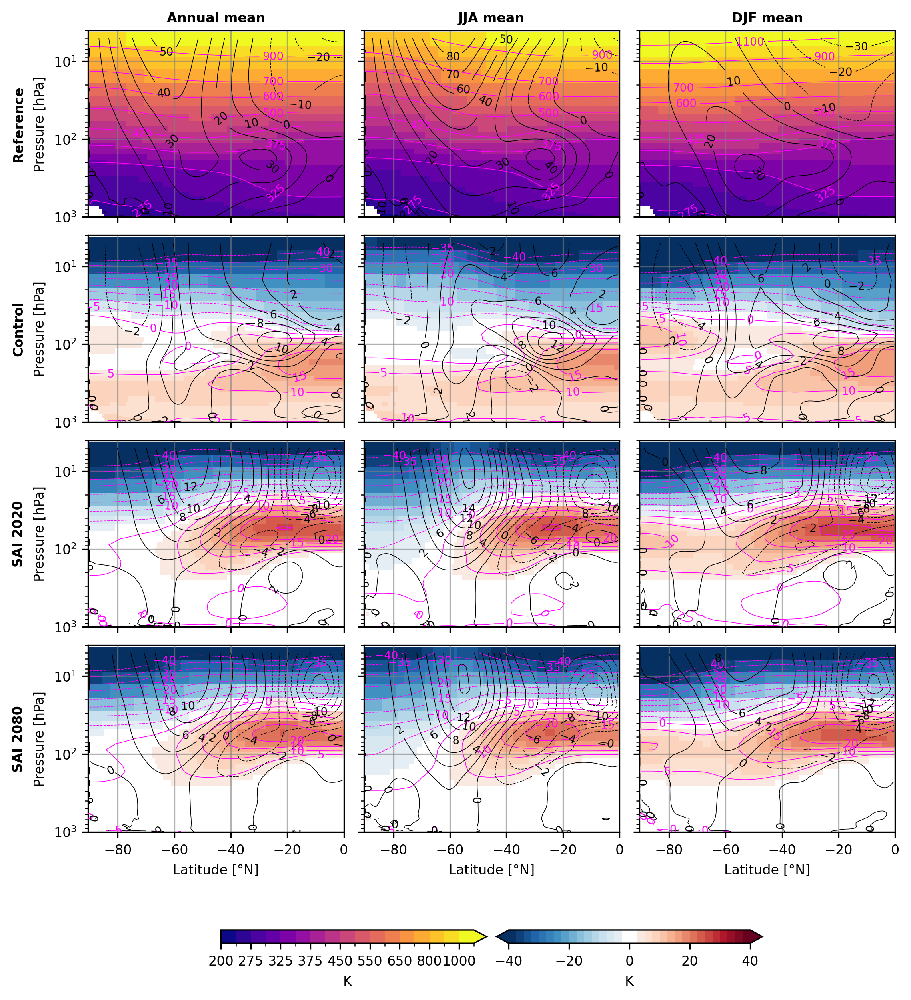

In [37]:
scen = ['i_c', 'cref', '20ref', '80ref']
scenJJA = ['iJJA_c', 'crefJJA', '20refJJA', '80refJJA']
scenDJF = ['iDJF_c', 'crefDJF', '20refDJF', '80refDJF']
scen_stack = np.asarray([scen, scenJJA, scenDJF])

scens_used = scen_stack.T.flatten()

sidelabels = ['Reference', 'Control', 'SAI 2020', 'SAI 2080']
toplabels = ['Annual mean', 'JJA mean', 'DJF mean']


comap = plt.get_cmap('plasma')
bounds = [200,250,275,300,325,350,375,400,450,500,550,600,650,700,800,900,1000,1100]
norm = colors.BoundaryNorm(bounds, comap.N)

comapd = mpl.colormaps['RdBu_r'].resampled(32)
newcolors = comapd(np.linspace(0,1,32))
white = np.array([1, 1, 1, 1])
newcolors[15:17,:] = white
newcmap = colors.ListedColormap(newcolors)

fig, axs = plt.subplots(4, 3, figsize=imgsize7, layout='constrained')
ax = axs.flatten()

font_kwargs = dict(fontweight="bold", fontsize=8)
add_headers(fig, col_headers=toplabels, row_headers=sidelabels, **font_kwargs)

for i,j in zip(ax,scens_used):    
    if j in scen_stack[:,0]:
        im = thzm[j].plot(ax=i, x='lat', y='plev', cmap=comap, norm=norm, add_colorbar=False)

        plot = thzm[j].plot.contour(ax=i, x='lat', y='plev', colors='magenta', linewidths=0.4, levels=[275,325,375,425,500,600,700,900,1100], kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        plot = Uzm[j].plot.contour(ax=i, x='lat', y='plev', colors='k', linewidths=0.4, vmin=-100, vmax=100, levels=21, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        i.set_xlabel(None)
        i.set_ylabel(None)
        i.invert_yaxis()
        i.set_yscale('log')
        i.grid(color='gray', alpha=0.6)
        i.set_ylim(10**3,4)
        
    else:
        im2 = thzm[j].plot(ax=i, x='lat', y='plev', cmap=newcmap, vmin=-40, vmax=40, add_colorbar=False)

        plot = thzm[j].plot.contour(ax=i, x='lat', y='plev', colors='magenta', linewidths=0.4, vmin=-40, vmax=40, levels=17, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
        
        plot = Uzm[j].plot.contour(ax=i, x='lat', y='plev', colors='k', linewidths=0.4, vmin=-16, vmax=16, levels=17, kwargs=dict(inline=True))
        i.clabel(plot, fontsize='small', inline_spacing=1)
    
        i.set_xlabel(None)
        i.set_ylabel(None)
        i.invert_yaxis()
        i.set_yscale('log')
        i.grid(color='gray', alpha=0.6)
        i.set_ylim(10**3,4)
    
    if i in axs[:,1:].flatten():
        i.set_yticklabels([])
    
    if i in axs[:,0].flatten():
        i.set_ylabel('Pressure [hPa]')
    
    if i in axs[:-1,:].flatten():
        i.set_xticklabels([])
    
    if i in axs[-1,:].flatten():
        i.set_xlabel('Latitude [°N]')


plt.colorbar(im, ax=axs[:,:2], shrink=0.5, location='bottom', label='K', extend='max')
plt.colorbar(im2, ax=axs[:,1:], shrink=0.5, location='bottom', label='K', extend='both')


if save == True: plt.savefig(savepath+'th_U_zmdiff_full.png');


## Annual mean plots

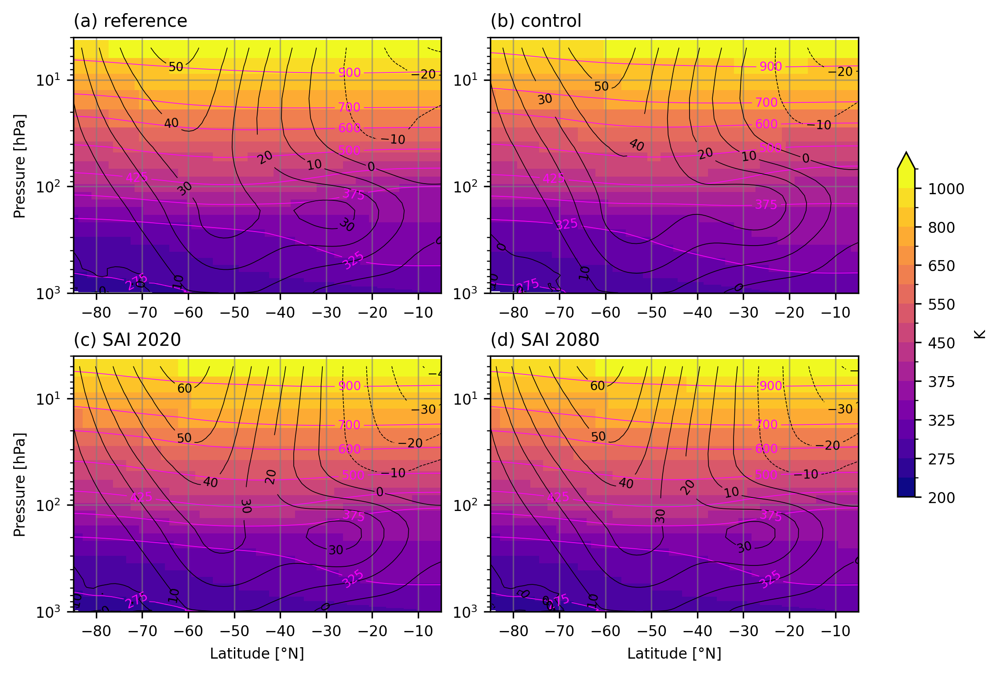

In [29]:
scen_used = ['i_c', 'f_c', 'f_20', 'f_80']
labels = ['(a) reference', '(b) control', '(c) SAI 2020', '(d) SAI 2080']
timesel = 'ann'

THplot()


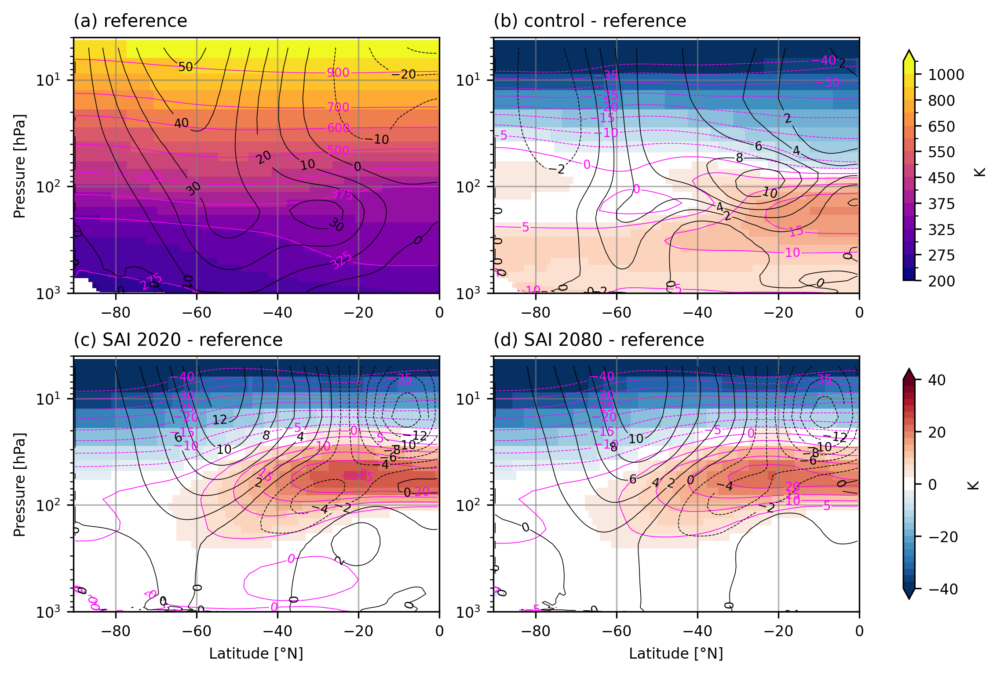

In [30]:
scen_used = ['i_c', 'cref', '20ref', '80ref']
labels = ['(a) reference', '(b) control - reference', '(c) SAI 2020 - reference', '(d) SAI 2080 - reference']
timesel = 'ann'

THdiffplot()    

## JJA mean plots

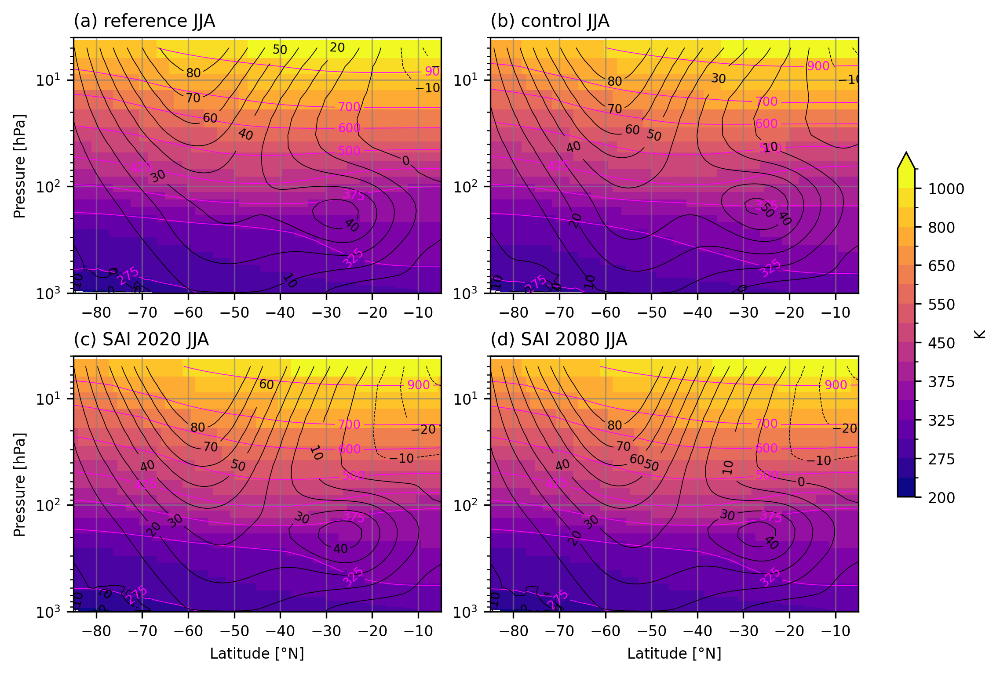

In [31]:
scen_used = ['iJJA_c', 'fJJA_c', 'fJJA_20', 'fJJA_80']
labels = ['(a) reference JJA', '(b) control JJA', '(c) SAI 2020 JJA', '(d) SAI 2080 JJA']
timesel = 'JJA'

THplot()

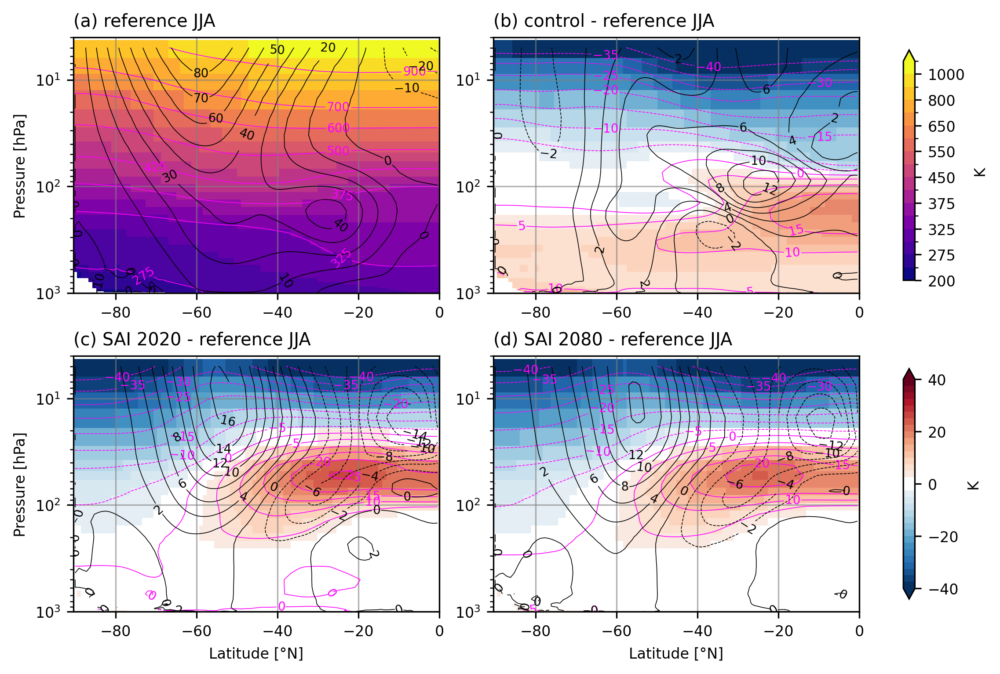

In [32]:
scen_used = ['iJJA_c', 'crefJJA', '20refJJA', '80refJJA']
labels = ['(a) reference JJA', '(b) control - reference JJA', '(c) SAI 2020 - reference JJA', '(d) SAI 2080 - reference JJA']
timesel = 'JJA'

THdiffplot()

## DJF mean plots

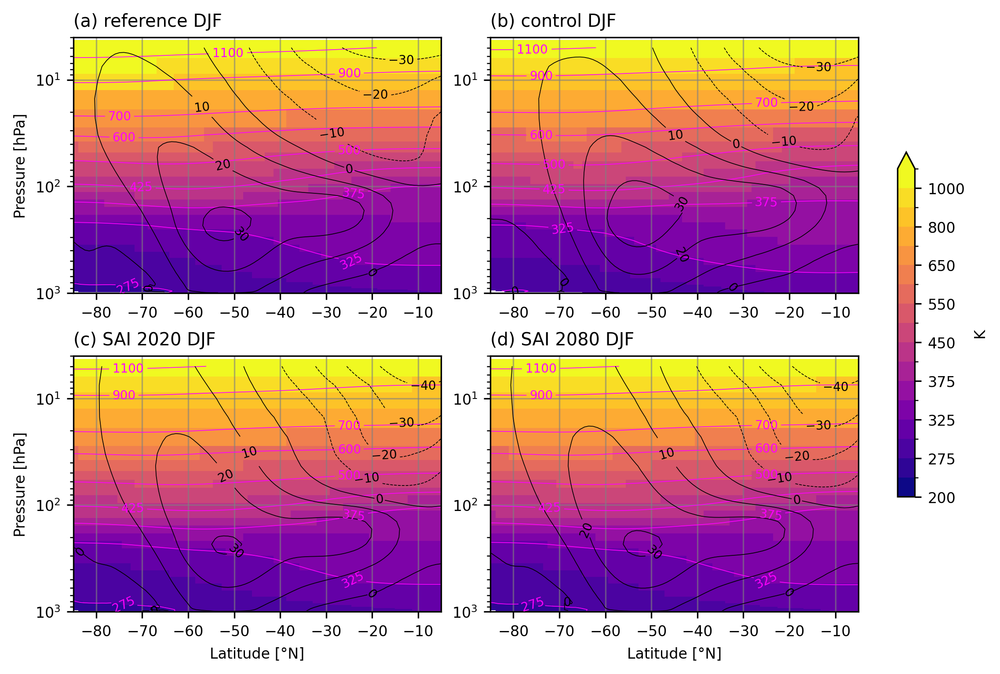

In [33]:
scen_used = ['iDJF_c', 'fDJF_c', 'fDJF_20', 'fDJF_80']
labels = ['(a) reference DJF', '(b) control DJF', '(c) SAI 2020 DJF', '(d) SAI 2080 DJF']
timesel = 'DJF'

THplot()

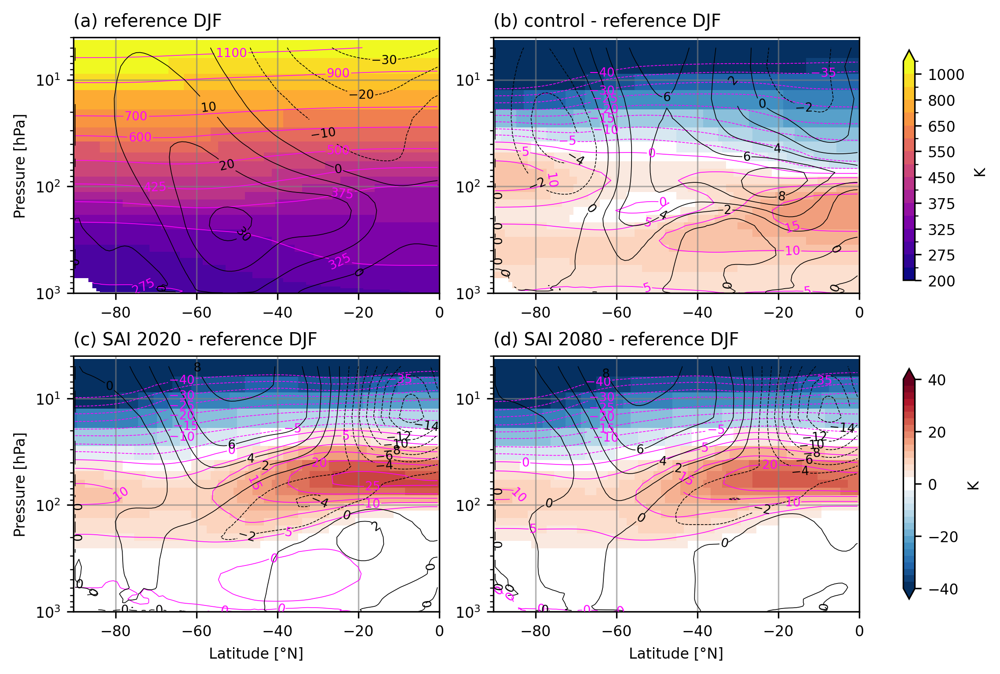

In [34]:
scen_used = ['iDJF_c', 'crefDJF', '20refDJF', '80refDJF']
labels = ['(a) reference DJF', '(b) control - reference DJF', '(c) SAI 2020 - reference DJF', '(d) SAI 2080 - reference DJF']
timesel = 'DJF'

THdiffplot()